In [1]:
# Bruno Vieira Ribeiro - 2021

In [2]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import re
import nltk, pprint
from nltk import word_tokenize

In [3]:
%config Completer.use_jedi = False        # For autocomplete to work!

In [4]:
sns.set(rc={'figure.figsize': (10, 6)})
sns.set_style('whitegrid')
sns.set_palette('Set2')

# Importing and first look at the data

Let's get our dataframe ready:

In [5]:
with open('./data/df_atla.data', 'rb') as filehandle:
    df_atla = pickle.load(filehandle)

In [6]:
df_atla.head()

,Character,script,ep_number,Book,total_number
0,NaN,"As the title card fades, the scene opens onto ...",1,1,1
1,Sokka,It's not getting away from me this time. [Clos...,1,1,1
2,NaN,"The shot pans quickly from Sokka to Katara, wh...",1,1,1
3,Katara,"[Happily surprised.] Sokka, look!",1,1,1
4,Sokka,"[Close-up of Sokka; whispering.] Sshh! Katara,...",1,1,1


In [7]:
df_atla.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13369 entries, 0 to 13368
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Character     9977 non-null   object
 1   script        13369 non-null  object
 2   ep_number     13369 non-null  int64 
 3   Book          13369 non-null  int64 
 4   total_number  13369 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 522.4+ KB


For quick check, let's load our episode number "guide":

In [8]:
with open('./data/ep_names.data', 'rb') as filehandle:
    episode_guide = pickle.load(filehandle)

We can create a helper function to check epsiode name given the number and book:

In [9]:
def check_episode(ep_number, book):
    '''
    Helper function to return name of episode given the episode number and Book
    '''
    return episode_guide[(episode_guide['ep_number'] == ep_number)
                         & (episode_guide['Book'] == book)].iloc[0, 0]

In [10]:
check_episode(9, 2)

'Bitter Work'

Let's start by checking the value counts for Characters:

In [11]:
df_atla['Character'].value_counts()

Aang                1795
Sokka               1635
Katara              1428
Zuko                 776
Toph                 507
                    ... 
Katara and Sokka       1
Girl                   1
Scribe                 1
Villager #4            1
Bodyguard              1
Name: Character, Length: 374, dtype: int64

We can get our first visual on the top 10 characters with more lines in the show:

First, we select the top 10 values from the `value_counts()` function.

In [12]:
# Top 10 charcaters (in number of lines)
top_10_characters = df_atla['Character'].value_counts()[:10]

Now we can simply plot this as a bar plot.

Text(0, 0.5, 'Number of lines')

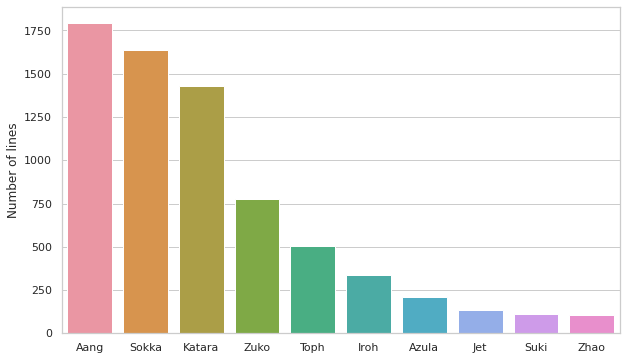

In [13]:
sns.barplot(x=top_10_characters.index, y=top_10_characters.values)
plt.ylabel('Number of lines')

Let's redo this with plotly for an awesome interaction.

In [14]:
fig = px.bar(top_10_characters, color=px.colors.qualitative.Light24[:10])
fig.update_layout(showlegend=False,
                  title="Top 10 Characters with more lines",
                  xaxis_title="Character",
                  yaxis_title="Number of lines")
fig.show()

The data set has two types of entries in the `Character` column:
* Named characters: corresponds to actual character lines in the show.

* NaN values: corresponding to scene descriptions.

I'll separate our data in two different dataframes, one for the lines and other for the descriptions.

In [15]:
df_description = df_atla[df_atla['Character'].isnull()]

In [16]:
df_lines = df_atla[~df_atla['Character'].isnull()]

# Description dataset

Info on the description dataframe:

In [17]:
df_description.head()

,Character,script,ep_number,Book,total_number
0,NaN,"As the title card fades, the scene opens onto ...",1,1,1
2,NaN,"The shot pans quickly from Sokka to Katara, wh...",1,1,1
5,NaN,"Behind Sokka, Katara is still making circular ...",1,1,1
7,NaN,The bubble containing her fish slowly drifts a...,1,1,1
9,NaN,"As Sokka lets out a gasp of discomfort, the fi...",1,1,1


In [18]:
df_description.tail()

,Character,script,ep_number,Book,total_number
13347,NaN,Cut to outside the palace with people from the...,21,3,61
13349,NaN,"Zuko kneels down, preparing to be crowned Fire...",21,3,61
13351,NaN,"Cut to Zuko walking toward the cheering crowd,...",21,3,61
13358,NaN,"In Ba Sing Se, kids are now using the stacked ...",21,3,61
13368,NaN,"Aang walks past Appa, petting him briefly, bef...",21,3,61


In [19]:
# Size of the description dataframe
len(df_description)

3392

In [20]:
# Size of the lines dataframe
len(df_lines)

9977

In [21]:
print(60 * '=')
print('Percentage of data corresponding to charcater lines:',
      round(100 * (len(df_lines) / len(df_atla)), 2), '%')
print()
print('Percentage of data corresponding to description text:',
      round(100 * (len(df_description) / len(df_atla)), 2), '%')
print(60 * '=')

Percentage of data corresponding to charcater lines: 74.63 %

Percentage of data corresponding to description text: 25.37 %


Let's check how many description lines we have per `Book`.

In [22]:
description_per_book = df_description.groupby(
    'Book')['script'].count().reset_index()

In [23]:
description_per_book

,Book,script
0,1,1120
1,2,1226
2,3,1046


In [24]:
fig = px.bar(description_per_book,
             color=px.colors.qualitative.Light24[:3],
             x='Book',
             y='script')
fig.update_layout(showlegend=False,
                  title="Number of description lines per Book",
                  xaxis_title="Book",
                  yaxis_title="Number of lines")
fig.show()

We will work, mainly, with the `lines` dataframe, so let's start our preprocessing there.

# Preprocessing the character lines

In [25]:
df_lines.head()

,Character,script,ep_number,Book,total_number
1,Sokka,It's not getting away from me this time. [Clos...,1,1,1
3,Katara,"[Happily surprised.] Sokka, look!",1,1,1
4,Sokka,"[Close-up of Sokka; whispering.] Sshh! Katara,...",1,1,1
6,Katara,[Struggling with the water that passes right i...,1,1,1
8,Katara,[Exclaims indignantly.] Hey!,1,1,1


Many lines have descriptions closed between [ ]. We can remove these using a simple regex expression to analyse only the actual lines.

In [26]:
# Test case
test = df_lines.iloc[1]['script']

In [27]:
test

'[Happily surprised.] Sokka, look!'

In [28]:
# Regex sub() method to find and replace expression between [ ]
test = re.sub("\[.*?\]", "", test)

In [29]:
test

' Sokka, look!'

In [30]:
df_lines['script'] = df_lines['script'].apply(
    lambda s: re.sub("\[.*?\]", "", s))

<ipython-input-30-5658146f0d4a>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [31]:
df_lines.head()

,Character,script,ep_number,Book,total_number
1,Sokka,It's not getting away from me this time. Watc...,1,1,1
3,Katara,"Sokka, look!",1,1,1
4,Sokka,"Sshh! Katara, you're going to scare it away. ...",1,1,1
6,Katara,"But, Sokka! I caught one!",1,1,1
8,Katara,Hey!,1,1,1


Let's try a quick look at the distribution of character lines. We'll create a `text` object with the sequence of characters as they appear in the `Character` column. To match a `tokenized` text, we can simply create a list of entries from our `Character` Series.

In [32]:
char_seq = df_lines['Character'].tolist()

In [33]:
type(char_seq)

list

In [34]:
type(char_seq[0])

str

In [35]:
char_seq[:20]

['Sokka',
 'Katara',
 'Sokka',
 'Katara',
 'Katara',
 'Sokka',
 'Katara',
 'Sokka',
 'Katara',
 'Katara',
 'Katara',
 'Sokka',
 'Katara',
 'Sokka',
 'Katara',
 'Katara',
 'Sokka',
 'Katara',
 'Sokka',
 'Katara']

Ok, so our `char_seq` object is a list of strings containing names of Characters as they have lines in the show. We want to turn this into a `Text` object from nltk:

In [36]:
char_seq_text = nltk.Text(char_seq)

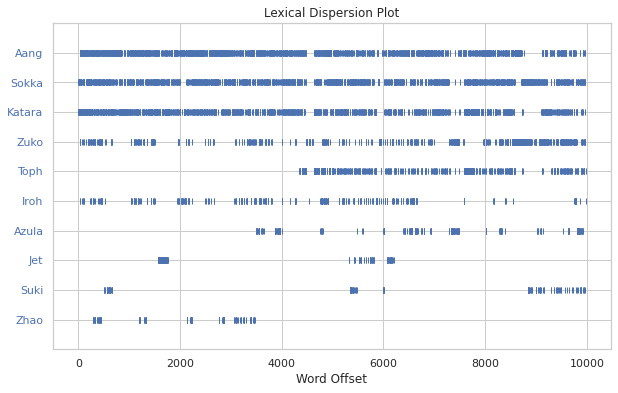

In [37]:
# char_seq_text.dispersion_plot(
#         ["Aang", "Katara", "Sokka", "Toph", "Zuko", "Iroh"]
#                     )
char_seq_text.dispersion_plot(list(top_10_characters.index))

This is a frist intersting visual on the distribution of lines in the show. For example, we can see that Zuko has a much denser distribution of lines by the end of the show (when he joins team Avatar!).

Let's just see how many total lines the show has:

In [38]:
len(df_lines)

9977

## Converting to lower case

In [39]:
df_lines.columns

Index(['Character', 'script', 'ep_number', 'Book', 'total_number'], dtype='object')

From this point on we'll do actual modifications (not just removing parts) in the `script`. So, we'll create a separate column called `script_clean` to do all the preprocessing steps.

In [40]:
df_lines['script_clean'] = df_lines['script'].str.lower()

<ipython-input-40-34a63d38e1bb>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [41]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean
1,Sokka,It's not getting away from me this time. Watc...,1,1,1,it's not getting away from me this time. watc...
3,Katara,"Sokka, look!",1,1,1,"sokka, look!"
4,Sokka,"Sshh! Katara, you're going to scare it away. ...",1,1,1,"sshh! katara, you're going to scare it away. ..."
6,Katara,"But, Sokka! I caught one!",1,1,1,"but, sokka! i caught one!"
8,Katara,Hey!,1,1,1,hey!


## Removing punctuation

We'll replace everything that's not alphanumeric or whitespace with an empty character:

In [42]:
df_lines['script_clean'] = df_lines['script_clean'].str.replace('[^\w\s]', '')

<ipython-input-42-cb4e8b5d0893>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [43]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean
1,Sokka,It's not getting away from me this time. Watc...,1,1,1,its not getting away from me this time watch ...
3,Katara,"Sokka, look!",1,1,1,sokka look
4,Sokka,"Sshh! Katara, you're going to scare it away. ...",1,1,1,sshh katara youre going to scare it away mmm...
6,Katara,"But, Sokka! I caught one!",1,1,1,but sokka i caught one
8,Katara,Hey!,1,1,1,hey


## Removing stopwords

We'll use `nltk`'s stopwords to remove all english stopwords from character lines.

In [44]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /home/bruno/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [45]:
from nltk.corpus import stopwords

The very first line would show us a weird thing about the stopwords: 'not' is technically an adverb but has still been included in NLTK’s list of stop words for English.

Let's remove this from the list of stop words so it makes more sense (Sokka is saying the fish is not getting away is very different from saying it is getting away...).

Inspecting the results way down the road, I have also found some common words in the show that can be removed and not alter the content of the lines. I'll include these as stop word here too.

In [46]:
stop_words = set(stopwords.words('english'))

In [47]:
newer_stopwords = ["that", "go", "yeah", "uh", "oh", "let", "hey", "okay"]
new_stopwords_list = stop_words.union(newer_stopwords)

new_stop_words = set(
    [word for word in new_stopwords_list if word not in {'not'}])

In [48]:
df_lines['script_clean'] = df_lines['script_clean'].apply(
    lambda s: " ".join(s for s in word_tokenize(s) if s not in new_stop_words))

<ipython-input-48-c8c7454b9cd8>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [49]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean
1,Sokka,It's not getting away from me this time. Watc...,1,1,1,not getting away time watch learn katara catch...
3,Katara,"Sokka, look!",1,1,1,sokka look
4,Sokka,"Sshh! Katara, you're going to scare it away. ...",1,1,1,sshh katara youre going scare away mmmm alread...
6,Katara,"But, Sokka! I caught one!",1,1,1,sokka caught one
8,Katara,Hey!,1,1,1,


## Word frequency

We have enough to check for the most common words in the show before digging deep in indivudal characters.

In [50]:
freq = pd.Series(' '.join(df_lines['script_clean']).split()).value_counts()

In [51]:
freq[:20]

im        881
dont      687
not       656
know      628
youre     600
fire      523
like      495
get       486
well      481
aang      422
think     403
avatar    390
thats     381
right     363
us        362
going     358
need      337
one       322
cant      312
see       308
dtype: int64

In [52]:
freq

im         881
dont       687
not        656
know       628
youre      600
          ... 
rooted       1
glimpse      1
spoon        1
haul         1
sources      1
Length: 6373, dtype: int64

In [53]:
fig = px.bar(freq[:20])
fig.update_layout(showlegend=False,
                  title="Most frequent words",
                  xaxis_title="Word",
                  yaxis_title="Frequency")
fig.show()

Let's check out the **rare** words (the ones that appear only once):

In [54]:
rare_words = list(freq[freq == 1].index)

In [55]:
rare_words

['recruited',
 'acknowledge',
 'closing',
 'page',
 'strikes',
 'granddaughter',
 'sandsailer',
 'rebirth',
 'cookin',
 'sensation',
 'deemed',
 'uncivilized',
 'karmically',
 'squish',
 'aggression',
 'attract',
 'ranked',
 'spending',
 'yield',
 'sneezed',
 'explaining',
 'denied',
 'terrorizing',
 'assailants',
 'tinkering',
 'platoon',
 'depend',
 'rhymes',
 'bolted',
 'willpower',
 'seashell',
 'earthquaking',
 'sorta',
 'fifth',
 'sliver',
 'sins',
 'gems',
 'floats',
 'summon',
 'sleuthy',
 'escorted',
 'seat',
 'alter',
 'demands',
 'cutie',
 'kwa',
 'bread',
 'rabbitmonkey',
 'ponds',
 'cumulus',
 'slipup',
 'wong',
 'hullabaloo',
 'assaulted',
 'erupt',
 'evade',
 'raorr',
 'contribution',
 'galley',
 'depths',
 'puncture',
 'banish',
 'typically',
 'iive',
 'wahhoo',
 'intermission',
 'bellys',
 'cake',
 'wig',
 'spirited',
 'ridin',
 'recommend',
 'fashion',
 'escorting',
 'blowing',
 'dozed',
 'hurray',
 'hut',
 'scooter',
 'irrational',
 'assured',
 'freestyle',
 'tin',
 

In [56]:
len(rare_words)

2799

## Stemming (and Lemmatization)

Let's start with stemming using the PorterStemmer from `nltk`:

In [57]:
from nltk.stem import PorterStemmer

In [58]:
st = PorterStemmer()

In [59]:
df_lines['script_clean'] = df_lines['script_clean'].apply(
    lambda s: ' '.join([st.stem(word) for word in word_tokenize(s)]))

<ipython-input-59-f818ababb077>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [60]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean
1,Sokka,It's not getting away from me this time. Watc...,1,1,1,not get away time watch learn katara catch fish
3,Katara,"Sokka, look!",1,1,1,sokka look
4,Sokka,"Sshh! Katara, you're going to scare it away. ...",1,1,1,sshh katara your go scare away mmmm alreadi sm...
6,Katara,"But, Sokka! I caught one!",1,1,1,sokka caught one
8,Katara,Hey!,1,1,1,


Now to lemmatize:

In [61]:
# from nltk.stem import WordNetLemmatizer

In [62]:
# nltk.download(['wordnet', 'punkt'])

In [63]:
# lemmatizer = WordNetLemmatizer()

In [64]:
# df_lines['script_clean'] = df_lines['script_clean'].apply(lambda s: ' '.join([lemmatizer.lemmatize(word) for word in word_tokenize(s)]))

In [65]:
# df_lines.head()

# Adding `polarity`, `subjectivity` and `word_count` as new features

We'll now use `textblob` to easily create new features, namely:

* `polarity`: Return the polarity score as a float within the range [-1.0, 1.0]. -1.0 refers to a very negative text, and 1.0 a very positive one.
* `subjectivity`: Return the subjectivity score as a float within the range [0.0, 1.0] where 0.0 is very objective and 1.0 is very subjective.
* `word_count`: word frequency in this text.

(All descriptions taken from the documentation [here](https://textblob.readthedocs.io/en/dev/api_reference.html#textblob.blob.TextBlob.sentiment))


In [66]:
from textblob import TextBlob, Word, Blobber

In [67]:
df_lines['polarity'] = df_lines['script'].map(
    lambda text: TextBlob(text).sentiment.polarity)

<ipython-input-67-a5a5c72e37ae>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [68]:
df_lines['subjectivity'] = df_lines['script'].map(
    lambda text: TextBlob(text).sentiment.subjectivity)

<ipython-input-68-f00de1dcdf73>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [69]:
df_lines['word_count'] = df_lines['script'].apply(
    lambda s: len(word_tokenize(s)))

<ipython-input-69-12ba04c2573c>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [70]:
df_lines.head(20)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
1,Sokka,It's not getting away from me this time. Watc...,1,1,1,not get away time watch learn katara catch fish,0.000000,0.000000,24
3,Katara,"Sokka, look!",1,1,1,sokka look,0.000000,0.000000,4
4,Sokka,"Sshh! Katara, you're going to scare it away. ...",1,1,1,sshh katara your go scare away mmmm alreadi sm...,0.000000,0.000000,22
6,Katara,"But, Sokka! I caught one!",1,1,1,sokka caught one,0.000000,0.000000,8
8,Katara,Hey!,1,1,1,,0.000000,0.000000,2
10,Sokka,Why is it that every time you play with magic ...,1,1,1,everi time play magic water get soak,0.500000,1.000000,16
12,Katara,"It's not ""magic"", it's waterbending! And it's...",1,1,1,not magic waterbend,-0.312500,1.000000,15
13,Sokka,"Yeah, yeah, ""an ancient art unique to our cul...",1,1,1,ancient art uniqu cultur blah blah blah look i...,-0.062500,1.000000,41
14,Katara,You're calling me weird? I'm not the one who ...,1,1,1,your call weird im not one make muscl everi ti...,-0.625000,1.000000,26
16,Katara,Watch out! Go left! Go left!,1,1,1,watch left left,0.000000,0.000000,9


For the whole cast of characters we can see the distribution of these newly create features:

array([[<AxesSubplot:title={'center':'word_count'}>,
        <AxesSubplot:title={'center':'polarity'}>],
       [<AxesSubplot:title={'center':'subjectivity'}>, <AxesSubplot:>]],
      dtype=object)

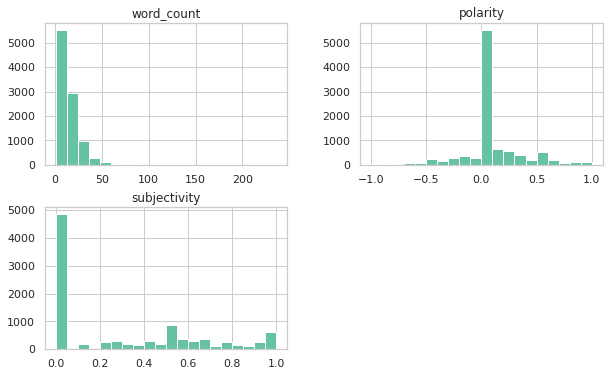

In [71]:
df_lines[['word_count', 'polarity', 'subjectivity']].hist(bins=20)

Using only words that appear more than 30 times:

array([[<AxesSubplot:title={'center':'word_count'}>,
        <AxesSubplot:title={'center':'polarity'}>],
       [<AxesSubplot:title={'center':'subjectivity'}>, <AxesSubplot:>]],
      dtype=object)

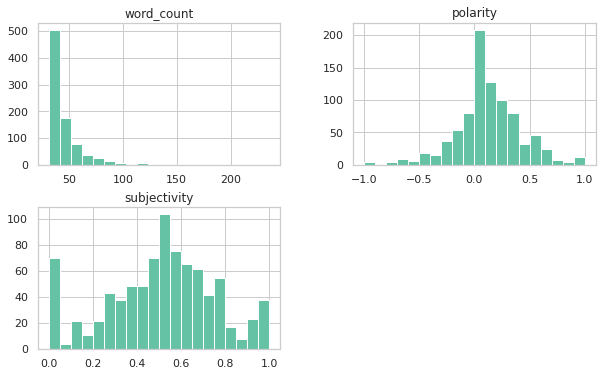

In [72]:
df_lines[df_lines['word_count'] > 30][[
    'word_count', 'polarity', 'subjectivity'
]].hist(bins=20)

## Exploring `polarity`, `subjectivity` and `word_count`

We can create a function to display distribution of word_count, polarity and subjectivity for a given character and given cut-off word_count

In [73]:
# Create a function to display distribution of word_count, polarity and subjectivity for a given character
# and given cut-off word_count
def plot_character_dists(characters, cut_off_word_count=0, bins=10):
    '''
    Plots histograms of word_count, polarity and sensitivity for all characetrs in characters.
    * characters is a tuple with all characters to be included.
    * cut_off_word_count is the minimum value of word_count to be included in the statistic
    * bins is the number of bins to plot
    '''
    df_lines[(df_lines['Character'].isin(characters))
             & (df_lines['word_count'] > cut_off_word_count)][[
                 'word_count', 'polarity', 'subjectivity'
             ]].hist(bins=bins)

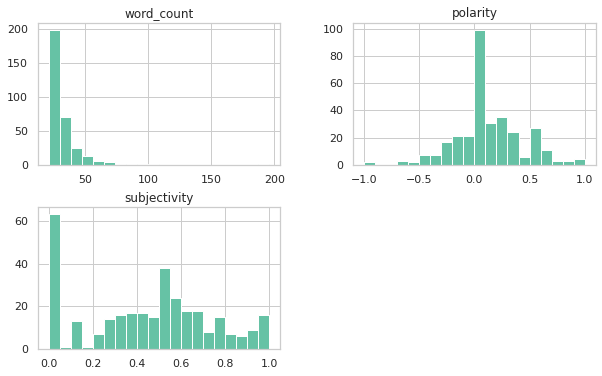

In [74]:
plot_character_dists(['Aang'], cut_off_word_count=20, bins=20)

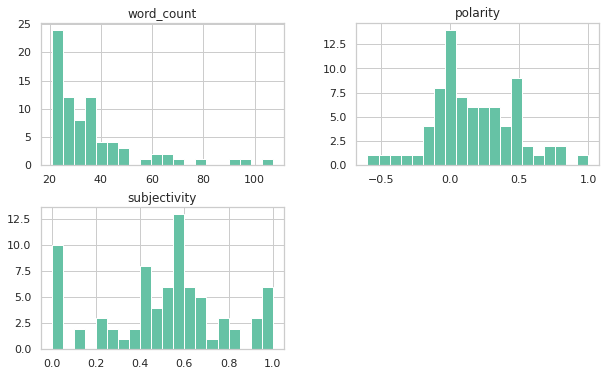

In [75]:
plot_character_dists(['Azula'], cut_off_word_count=20, bins=20)

In [76]:
# tuple(top_10_characters.index)

Let's see the distributions for all top 10 characters with more lines:

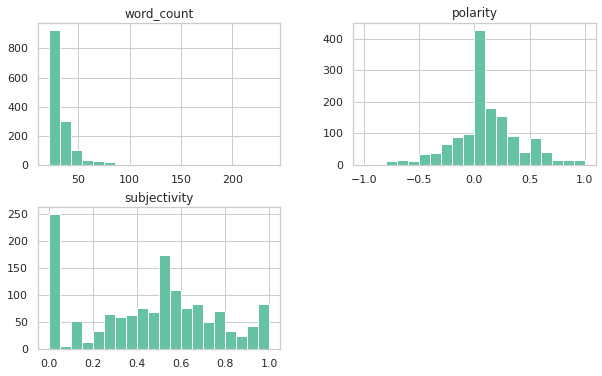

In [77]:
plot_character_dists(tuple(top_10_characters.index),
                     cut_off_word_count=20,
                     bins=20)

In [78]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
1,Sokka,It's not getting away from me this time. Watc...,1,1,1,not get away time watch learn katara catch fish,0.0,0.0,24
3,Katara,"Sokka, look!",1,1,1,sokka look,0.0,0.0,4
4,Sokka,"Sshh! Katara, you're going to scare it away. ...",1,1,1,sshh katara your go scare away mmmm alreadi sm...,0.0,0.0,22
6,Katara,"But, Sokka! I caught one!",1,1,1,sokka caught one,0.0,0.0,8
8,Katara,Hey!,1,1,1,,0.0,0.0,2


To better explore different characetrs let's group by `Character` and inspect our newly created features.

In [79]:
by_character = df_lines.groupby('Character')[[
    'polarity', 'subjectivity', 'word_count'
]].mean().reset_index()

In [80]:
by_character.head()

,Character,polarity,subjectivity,word_count
0,Aang,0.074008,0.268734,13.003343
1,Aang and Sokka,0.000000,0.000000,2.000000
2,Aang and Zuko,0.000000,0.000000,2.000000
3,Aang:,-0.107143,0.717857,15.000000
4,Actor Bumi,0.000000,0.000000,16.000000


Weird: it appears somewhere in the `Character` column there is an `Aang:` entry instead of just `Aang`. Let's see if this repeats somewhere else. To do this we check if any entry in this column contains the character `:`.

In [81]:
df_lines[df_lines['Character'].str.contains(':')]

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
2355,Aang:,Um ... Sokka? You know we're going the wrong w...,10,1,10,um sokka know go wrong way right,-0.107143,0.717857,15
7144,Sha-Mo:,What did you do‌?,11,2,31,,0.000000,0.000000,5


We can quickly get rid of these:

In [82]:
df_lines.at[2355, 'Character'] = 'Aang'
df_lines.at[7144, 'Character'] = 'Sha-Mo'

Check if it worked:

In [83]:
df_lines[df_lines['Character'].str.contains(':')]

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count


Cool! We can carry on!

In [84]:
by_character = df_lines.groupby('Character')[[
    'polarity', 'subjectivity', 'word_count'
]].mean().reset_index()
by_character.head()

,Character,polarity,subjectivity,word_count
0,Aang,0.073907,0.268985,13.004454
1,Aang and Sokka,0.000000,0.000000,2.000000
2,Aang and Zuko,0.000000,0.000000,2.000000
3,Actor Bumi,0.000000,0.000000,16.000000
4,Actor Iroh,0.112500,0.270000,12.200000


In [85]:
fig = px.bar(
    by_character, x='Character', y='polarity',
    title='Mean Polarity').update_xaxes(categoryorder="total descending")
fig.show()

Ok, so there are waaaay too many names here. Let's focus our analysis on the top 10 characters:

In [86]:
by_character_top10 = df_lines[(df_lines['Character'].isin(
    tuple(top_10_characters.index)))].groupby('Character')[[
        'polarity', 'subjectivity', 'word_count'
    ]].mean().reset_index()
by_character_top10

,Character,polarity,subjectivity,word_count
0,Aang,0.073907,0.268985,13.004454
1,Azula,0.104473,0.367425,19.810427
2,Iroh,0.154453,0.425974,19.178042
3,Jet,0.088740,0.257608,15.276119
4,Katara,0.059639,0.294216,13.300420
5,Sokka,0.059001,0.294329,14.513761
6,Suki,0.084128,0.337363,13.877193
7,Toph,0.042296,0.273820,13.854043
8,Zhao,0.072955,0.352948,18.579439
9,Zuko,0.031985,0.270333,14.835052


This is much better! Let's see which character has the highest `polarity`. This is a value between -1 and 1 indicating how positive a statement is. Value 1 means a very positive sentence whereas -1 means a very negative one.

In [87]:
fig = px.bar(
    by_character_top10, x='Character', y='polarity',
    title='Mean Polarity').update_xaxes(categoryorder="total descending")
fig.show()

Not surprisingly, Iroh tops the list as the most **positive** character in average. He is followed by Azula, which makes sense as she is a very sure and calm character (you now, besides being super evil and before having her break down by the end...). Again, not surprisingly, Zuko stands out as the most negative out of these characters, in average.

We can do the same for `Subjectivity` and `Word Count`.

In [88]:
fig = px.bar(
    by_character_top10,
    x='Character',
    y='subjectivity',
    title='Mean Subjectivity').update_xaxes(categoryorder="total descending")
fig.show()

Iroh, again, tops the list as the least objective character. To understand this, let's see a quote from Zuko's impersonation of Iroh:
> "Zuko, you must look within yourself to save yourself from your other self. Only then will your true self reveal itself."

So, yeah, he's not the most objective guy when talking (but surely is wise!).
Jet also stands out as the most obejctive of all top 10 characters. He does stand out to me as one with few words but a very straight-to-the-point guy, so seems right.

Now onto the word count stats:

In [89]:
fig = px.bar(
    by_character_top10, x='Character', y='word_count',
    title='Mean Word Count').update_xaxes(categoryorder="total descending")
fig.show()

Ok, this makes a lot of sense, when Azula talks she tends to be very wordy (maybe a way to gatter as much attention as she can...). Aang is the charcater with more lines, so he may have a lot of small lines bringing hes mean word count down. We can see this by looking at his word count distribution:

In [90]:
fig = px.histogram(df_lines[df_lines['Character'] == 'Aang'], x="word_count")
fig.show()

Wow, there is a huge line with over 180 words! Let's check it out:

In [91]:
df_lines[(df_lines['Character'] == 'Aang') & (df_lines['word_count'] > 180)]

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
2523,Aang,"No, I mean I really knew them. I might not loo...",11,1,11,mean realli knew might not look im hundr twelv...,0.033854,0.399653,196


In [92]:
df_lines[(df_lines['Character'] == 'Aang')
         & (df_lines['word_count'] > 180)].iloc[0, 1]

"No, I mean I really knew them. I might not look it, but I'm a hundred and twelve years old. I was there one hundred years ago on the day you're talking about.  There seems to be a lot of confusion about what happened. First of all, Jin Wei and Wei Jin weren't enemies. They were brothers, twins in fact, and they were eight; and most importantly, they were just playing a game! The sacred orb from the legend, that was the ball! And the eastern and western gates were the goal posts. Jin Wei had the ball and was running toward the goal when he fell and fumbled it. Wei Jin didn't steal the ball, he picked it up and started running it toward the other goal, but he stepped out of bounds, so the official put him in the penalty box. Not for twenty long years but for two short minutes.  There was no stealing and no putting anyone in imprison, it was just a game."

Excluding this one, let's look at Aang's distribution of word count:

In [93]:
aang_lines = len(df_lines[(df_lines['Character'] == 'Aang')
                          & (df_lines['word_count'] < 180)])
fig = px.histogram(df_lines[(df_lines['Character'] == 'Aang')
                            & (df_lines['word_count'] < 180)],
                   x="word_count",
                   title=f'Aang - {aang_lines} lines')
fig.show()

Let's check Azula's distribution:

In [94]:
azula_lines = len(df_lines[df_lines['Character'] == 'Azula'])
fig = px.histogram(df_lines[df_lines['Character'] == 'Azula'],
                   x="word_count",
                   title=f'Azula - {azula_lines} lines')
fig.show()

In [95]:
# fig = px.histogram(df_lines[(df_lines['Character']=='Aang') & (df_lines['word_count']>20)], x="polarity")
# fig.show()

## Polarity across episodes

For a given character let's see if we can get a nice visual on the evolution of hers(his) polarity across episodes.

We can start with Aang:

In [96]:
fig = px.line(df_lines[df_lines['Character'] == 'Aang'], y="polarity")
fig.show()

Ok, this is messy (even though we can see some patterns). We can try to see the mean value of polarity for each episode.

Let's try a simple approach:
* Select all of Aang's lines
* Group the df by `total_number`
* Get the mean of all numeric values.

This can be done in one line, as seen bellow:

In [97]:
# aang_script = {'Book1': df_lines[(df_lines['Character']=='Aang') & (df_lines['Book']==1)],
#                'Book2': df_lines[(df_lines['Character']=='Aang') & (df_lines['Book']==2)],
#                'Book3': df_lines[(df_lines['Character']=='Aang') & (df_lines['Book']==3)]}

In [98]:
# aang_mean_values = pd.concat([
#             aang_script['Book1'].groupby('ep_number')[['Book','polarity','subjectivity','word_count']].mean().reset_index(),
#             aang_script['Book2'].groupby('ep_number')[['Book','polarity','subjectivity','word_count']].mean().reset_index(),
#             aang_script['Book3'].groupby('ep_number')[['Book','polarity','subjectivity','word_count']].mean().reset_index()
#                    ]).reset_index(drop=True)

In [99]:
aang_mean_values = df_lines[(
    df_lines['Character'] == 'Aang')].groupby('total_number')[[
        'ep_number', 'Book', 'polarity', 'subjectivity', 'word_count'
    ]].mean().reset_index()

aang_mean_values.head()

,total_number,ep_number,Book,polarity,subjectivity,word_count
0,1,1.0,1.0,0.003113,0.279874,11.893617
1,2,2.0,1.0,0.081508,0.198452,12.966667
2,3,3.0,1.0,0.085558,0.298465,11.673077
3,4,4.0,1.0,0.043753,0.254739,10.271186
4,5,5.0,1.0,0.056557,0.229087,12.285714


In [100]:
fig = px.line(aang_mean_values, y="polarity", hover_data=['ep_number', 'Book'])
fig.show()

What's going on with that one episode with super low polarity? You can check the episode's number and book by hovering over it (thanks plotly!):

In [101]:
check_episode(15, 3)

'The Boiling Rock, Part 2'

If you've watched the show you'd probably be surprised that Aang even has a line in this episode, as it is focused mainly on Sokka and Zuko. So, let's try to get Aang's lines in this episode:

In [102]:
df_lines[(df_lines['Character'] == 'Aang') & (df_lines['ep_number'] == 15) &
         (df_lines['Book'] == 3)]['script']

12232    Sounds like a crazy fishing trip.
Name: script, dtype: object

That's it! Aang's entire script in this episode is that one sentence about how crazy Sokka and Zuko's trip was. So, it shouldn't be taken as an episode of Aang being super negative...

---
### Polarity by episode for given character

Now, can we get this into a function for any given character? If so, can we create a dictionary with this dataframe for all top 10 characters with more lines?

In [103]:
def get_mean_per_episode(character):
    '''
    Returns the evolution of mean numeric values by episode for a given character
    '''
    char_mean_values = df_lines[(
        df_lines['Character'] == character)].groupby('total_number')[[
            'ep_number', 'Book', 'polarity', 'subjectivity', 'word_count'
        ]].mean().reset_index()

    return char_mean_values

In [104]:
top_10_mean_values = {}
for char in top_10_characters.index:
    top_10_mean_values[char] = get_mean_per_episode(char)

In [209]:
with open('./data/top_mean_values.data', 'wb') as filehandle:
    # store the data as binary data stream
    pickle.dump(top_10_mean_values, filehandle)

Let's check Zuko's polarity evolution, as he is very known to have a brilliant character development.

In [105]:
top_10_mean_values['Zuko']

,total_number,ep_number,Book,polarity,subjectivity,word_count
0,1,1.0,1.0,0.194401,0.445278,24.125000
1,2,2.0,1.0,0.056713,0.115741,13.000000
2,3,3.0,1.0,0.032711,0.291964,13.909091
3,4,4.0,1.0,0.110938,0.404398,13.416667
4,7,7.0,1.0,-0.007044,0.122421,13.500000
5,8,8.0,1.0,-0.012990,0.189706,10.823529
6,9,9.0,1.0,0.014075,0.146627,11.916667
7,12,12.0,1.0,0.113636,0.304545,10.727273
8,13,13.0,1.0,0.000000,0.000000,14.166667
9,15,15.0,1.0,-0.042105,0.052632,9.315789


In [106]:
fig = px.line(top_10_mean_values['Zuko'],
              y="polarity",
              hover_data=['ep_number', 'Book'])
fig.show()

Zuko's polarity seems to have a tendency to get lower as the show progresses. He does go through a bit of a transformation and lots of hardship. Let's use the hover data to see his three major low points:

In [107]:
print(check_episode(14, 2))
print(check_episode(10, 3))
print(check_episode(20, 3))

City of Walls and Secrets
The Day of Black Sun, Part 1: The Invasion
Sozin's Comet, Part 3: Into the Inferno


We can create a helper function to return all info for a given character, given episode's number and book:

In [108]:
def get_character_lines(char, episode, book):
    '''
    Return a pandas dataframe with info on a given list of characters (char) for given book and episode
    '''
    return df_lines[(df_lines['Character'].isin(char))
                    & (df_lines['Book'] == book) &
                    (df_lines['ep_number'] == episode)]


def get_character_lines_episode(char, episode):
    '''
    Return a pandas dataframe with info on a given list of characters (char) for given episode number (1 to 61)
    '''
    return df_lines[(df_lines['Character'].isin(char))
                    & (df_lines['total_number'] == episode)]

In [109]:
# First low point:
get_character_lines(['Zuko'], 14, 2)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
7627,Zuko,This city is a prison. I don't want to make a...,14,2,34,citi prison dont want make life,0.000000,0.000000,16
7646,Zuko,Ridiculous.,14,2,34,ridicul,-0.333333,1.000000,2
7652,Zuko,"Uncle, that's what all tea is.",14,2,34,uncl that tea,0.000000,0.000000,9
7704,Zuko,We've been working in a tea shop all day! I'...,14,2,34,weve work tea shop day im sick tea,-0.892857,0.857143,17
7766,Zuko,You want a show? I'll give you a show!,14,2,34,want show ill give show,0.000000,0.000000,12
7802,Zuko,You're the one who needs help.,14,2,34,your one need help,0.000000,0.000000,8


Ok, this makes sense, Zuko was pretty pissed off when they first arrived at Ba Sing Se.

In [110]:
# Second low point:
get_character_lines(['Zuko'], 10, 3)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
11040,Zuko,I'm sorry Mai.,10,3,50,im sorri mai,-0.500000,1.00000,5
11063,Zuko,"I know I've made some bad choices, but today, ...",10,3,50,know ive made bad choic today im gon na set th...,-0.207143,0.60119,20


So, this is during the invasion, when he leaves his home and a letter to Mai explaining his choice. He was really apologetic and kind of sad for Mai, so makes sense to have a low polarity for this one too.

In [111]:
# Third low point:
get_character_lines(['Zuko'], 20, 3)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
13129,Zuko,It's not her I'm worried about. I'm worried ab...,20,3,60,not im worri im worri aang doesnt gut take fat...,-0.3,0.1,34
13253,Zuko,"Sorry, but you're not gonna become Fire Lord t...",20,3,60,sorri your not gon na becom fire lord today,-0.5,1.0,16
13258,Zuko,You're on.,20,3,60,your,0.0,0.0,4
13261,Zuko,I know. But I can take her this time.,20,3,60,know take time,0.0,0.0,11
13263,Zuko,There's something off about her; I can't expla...,20,3,60,there someth cant explain she slip way one els...,-0.1,0.1,29
13266,Zuko,No you're not.,20,3,60,your not,0.0,0.0,5
13269,Zuko,No lightning today? What's the matter? Afrai...,20,3,60,lightn today what matter afraid ill redirect,-0.6,0.9,15
13272,Zuko,No!,20,3,60,,0.0,0.0,2


This is one of the best scenes in the show: Zuko and Azula's final Agni Kai! Zuko is overall worried about Aang in the first scene (his first line). By the end he notices Azula's having a break down and uses that to leverage the figth, so his lines tend to be provacative ("No lightning today? What's the matter? Afraid I'll redirect it?" and "Sorry, but you're not gonna become Fire Lord today. I am."). 

These three episodes represent well Zuko's final decision:
* from being an outcast away from his royal condition in *City of Walls and Secrets*
* to making a dramatic life decision and leaving his home to help bring his father down in *The Day of Black Sun, Part 1: The Invasion*
* and finally confronting his sister in an awesome Agni Kai where, for once, **he** was the calm and centered one doing the provoking.

We could go on doing this analysis for all charcaters (because it's so much fun!), but I'll leave the tools here for future exploring and for the curious minds.

---

To get an overall view of the top 10 characters, we can build a cool visual showing all the evolutions of characters polarity per episode in a single graph. Using *plotly*, this can generate a clean, pretty and interactive figure:

In [112]:
fig = go.Figure()

for char in top_10_characters.index:

    fig.add_scatter(x=top_10_mean_values[char]['total_number'],
                    y=top_10_mean_values[char]['polarity'],
                    hovertext=list(
                        zip(top_10_mean_values[char]['ep_number'],
                            top_10_mean_values[char]['Book'])),
                    name=char)
fig.update_layout(
    title="Evolution of polarity - Top 10 Characters with more lines",
    xaxis_title="Episode number (in entire series)",
    yaxis_title="Mean polarity of lines",
    hovermode="x unified")

fig.add_vrect(
    # Add background color for Book 1
    x0=1,
    x1=20,
    fillcolor="LightBlue",
    opacity=0.5,
    layer="below",
    line_width=0,
)

fig.add_vrect(
    # Add background color for Book 2
    x0=20,
    x1=40,
    fillcolor="LightGreen",
    opacity=0.5,
    layer="below",
    line_width=0,
)

fig.add_vrect(
    # Add background color for Book 3
    x0=40,
    x1=64,
    fillcolor="Red",
    opacity=0.2,
    layer="below",
    line_width=0,
)

fig.add_annotation(x=4,
                   y=0.5,
                   text="Book 1",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="Blue"))
fig.add_annotation(x=30,
                   y=0.5,
                   text="Book 2",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="DarkGreen"))
fig.add_annotation(x=50,
                   y=0.5,
                   text="Book 3",
                   showarrow=False,
                   yshift=10,
                   font=dict(family="Courier New, monospace",
                             size=16,
                             color="crimson"))

fig.show()

Highest mean polarity happens for Iroh in episode 7, book 2. Let's inspect that:

In [113]:
 check_episode(7,2)

'Zuko Alone'

In [114]:
get_character_lines(['Iroh'], 7, 2)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
6094,Iroh,"If the city is as magnificent as its wall, Ba...",7,2,27,citi magnific wall ba sing se must someth beho...,0.65625,0.666667,39


In [115]:
get_character_lines(['Iroh'], 7, 2).iloc[0,1]

" If the city is as magnificent as its wall, Ba Sing Se must be something to behold. I hope you all may see it someday, if we don't burn it to the ground first! "

The lowest mean polarity happens for Sokka in book 3, episode 5:

In [116]:
 check_episode(5,3)

'The Beach'

In [117]:
get_character_lines(['Sokka'], 5, 3)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
9994,Sokka,This is crazy! How can we beat a guy who blows...,5,3,45,crazi beat guy blow thing mind,-0.75,0.9,18


In [118]:
get_character_lines(['Sokka'], 5, 3).iloc[0,1]

'This is crazy! How can we beat a guy who blows things up with his mind?'

### Plotting subjectivity and word_count per episode

To see the same figure for other attributes (like `subjectivity` and `word_count`), we can turn this last cell into a function accepting the attribute as an input:

In [119]:
def plot_top10_evolution(attribute, ymax = 1):
    fig = go.Figure()

    for char in top_10_characters.index:

        fig.add_scatter(x = top_10_mean_values[char]['total_number'],
                        y = top_10_mean_values[char][attribute],
                        hovertext=list(zip(top_10_mean_values[char]['ep_number'],
                                      top_10_mean_values[char]['Book'])),
                        name = char)
    fig.update_layout(
        title="Evolution of "+ attribute +" - Top 10 Characters with more lines",
        xaxis_title="Episode number (in entire series)",
        yaxis_title="Mean "+attribute+" of lines"
    )
    fig.update_layout(hovermode="x unified")

    fig.add_vrect(
        # Add background color for Book 1
        x0=1, x1=20,
        fillcolor="LightBlue", opacity=0.5,
        layer="below", line_width=0,
    )

    fig.add_vrect(
        # Add background color for Book 2
        x0=20, x1=40,
        fillcolor="LightGreen", opacity=0.5,
        layer="below", line_width=0,
    )

    fig.add_vrect(
        # Add background color for Book 3
        x0=40, x1=64,
        fillcolor="Red", opacity=0.2,
        layer="below", line_width=0,
    )

    fig.add_annotation(x=4, y=ymax,
                text="Book 1",
                showarrow=False,
                yshift=10,
                font=dict(
                    family="Courier New, monospace",
                    size=16,
                    color="Blue"
                )
                      )
    fig.add_annotation(x=30, y=ymax,
                text="Book 2",
                showarrow=False,
                yshift=10,
                font=dict(
                    family="Courier New, monospace",
                    size=16,
                    color="DarkGreen"
                )
                      )
    fig.add_annotation(x=50, y=ymax,
                text="Book 3",
                showarrow=False,
                yshift=10,
                font=dict(
                    family="Courier New, monospace",
                    size=16,
                    color="crimson"
                )
                      )


    fig.show()

#### Subjectivity

In [120]:
plot_top10_evolution('subjectivity')

Highest mean subjectivity happens for Iroh on book 3, episode 20:

In [121]:
check_episode(20,3)

"Sozin's Comet, Part 3: Into the Inferno"

In [122]:
get_character_lines(['Iroh'], 20, 3)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
13205,Iroh,Only once every hundred years can a firebende...,20,3,60,everi hundr year firebend experi kind power,0.3,0.95,14


In [123]:
get_character_lines(['Iroh'], 20, 3).iloc[0,1]

' Only once every hundred years can a firebender experience this kind of power.'

This line has a `subjectivity` of 0.95. It is closely followed by Sokka on episode 5 in the same book and Aang on episde 15. Both of these have a subjectivity of 0.9. Let's chek them out:

In [124]:
get_character_lines(['Sokka'], 5, 3).iloc[0,1]

'This is crazy! How can we beat a guy who blows things up with his mind?'

In [125]:
get_character_lines(['Aang'], 15, 3).iloc[0,1]

'Sounds like a crazy fishing trip.'

#### Word_count

In [126]:
plot_top10_evolution('word_count')

The only character to have over 40 words on average in a single episode is Azula on book 3, episode 6. Let's inspect:

In [127]:
check_episode(6, 3)

'The Avatar and the Fire Lord'

In [128]:
get_character_lines(['Azula'], 6, 3)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
10075,Azula,It's never too early for a sitting with the co...,6,3,46,never earli sit court painter zuko make sure g...,0.433333,0.596296,23
10077,Azula,"Oh, Zuko, it's so strange how your mind works...",6,3,46,zuko strang mind work fire lord sozin began wa...,0.121852,0.477037,81
10079,Azula,"Didn't you pay any attention in school, Zuko?...",6,3,46,didnt pay attent school zuko die peac sleep an...,0.250000,0.500000,23


In [129]:
for i in range(3):
    print(f'Line {i+1}:')
    print(get_character_lines(['Azula'], 6, 3).iloc[i,1])
    print()

Line 1:
It's never too early for a sitting with the court painter, Zuko. Make sure he gets your good side.

Line 2:
 Oh, Zuko, it's so strange how your mind works.  Fire Lord Sozin began the war, of course.  He spent his early years secretly preparing for it. He was as patient as he was clever. He famously waited for the comet, later renamed Sozin's Comet, and used its power to launch his full-scale invasion of the world.  In the end, he died a very old and successful man.

Line 3:
 Didn't you pay any attention in school, Zuko? He died peacefully, in his sleep.  He was ancient.



## Distributions for characters

To help speed up the process for here on, let's define a dataframe for only the top 10 charcaters with more lines:

In [130]:
df_lines_top10 = df_lines[( df_lines['Character'].isin(tuple(top_10_characters.index)) )]

Now to create neat boxplots for distributions of polarity:

In [131]:
fig = px.box(df_lines_top10, x="Character", y="polarity",
            color='Character')
fig.show()

Check out how Zuko has the more spread out distribution among these characters.

---

Now for `subjectivity` and `word_count`:


In [132]:
fig = px.box(df_lines_top10, x="Character", y="subjectivity",
            color='Character')
fig.show()

In [133]:
fig = px.box(df_lines_top10, x="Character", y="word_count",
            color='Character')
fig.show()

## Distributions for Books

We can see these same distributions per Book:


In [134]:
fig = px.box(df_lines_top10, x="Book", y="polarity",
            color='Book')
fig.show()

In [135]:
fig = px.box(df_lines_top10, x="Book", y="subjectivity",
            color='Book')
fig.show()

In [136]:
fig = px.box(df_lines_top10, x="Book", y="word_count",
            color='Book')
fig.show()

The word count slightly increases form book to book. In book 3 the distribution has a lot more points 

# Polarity vs. Subjectivity and word_count

In [137]:
fig = px.scatter(df_lines, x="subjectivity", y="polarity")
fig.show()

Ok, so it seems polarity is way more spread out for higher values of subjectivity. It makes sense, as objective sentences tend to have a very neutral polarity.

Let's rebuild this graph for the top 10 characters and show size of markers according to the word count for each character.

In [138]:
fig = px.scatter(df_lines_top10, x="subjectivity", y="polarity",
                 color='Character', size='word_count',
                 title='Top 10 characters with more lines')
fig.show()

Doing `word_count` vs. `polarity` we can better see that "neutral" sentences (polarity close to 0) have higher word counts.

In [139]:
fig = px.scatter(df_lines_top10, x="polarity", y="word_count",
                 color='Character',
                 title='Top 10 characters with more lines')
fig.show()

# Top episodes with highest means

Let's inspect the mean values for `polarity`, `subjectivity` and `word_count` for episodes and rank them.

## Polarity

In [140]:
df_lines_top10.head()

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
1,Sokka,It's not getting away from me this time. Watc...,1,1,1,not get away time watch learn katara catch fish,0.0,0.0,24
3,Katara,"Sokka, look!",1,1,1,sokka look,0.0,0.0,4
4,Sokka,"Sshh! Katara, you're going to scare it away. ...",1,1,1,sshh katara your go scare away mmmm alreadi sm...,0.0,0.0,22
6,Katara,"But, Sokka! I caught one!",1,1,1,sokka caught one,0.0,0.0,8
8,Katara,Hey!,1,1,1,,0.0,0.0,2


Let's create a dataframe with the mean values of `polarity`,`subjectivity`,`word_count` (I'll use `ep_number` and `Book` just to simplify plotting later) grouped by episode. This way we can sort values by a given column and rank episodes accordingly.

In [141]:
lines_by_episode = df_lines_top10.groupby('total_number')[['polarity','subjectivity','word_count', 'ep_number', 'Book']].mean().reset_index()

To visualize our episodes on a bar plot, I'll create a `ep_name` column using our **check_episode** helper function:

In [142]:
lines_by_episode['ep_name'] = lines_by_episode.apply(lambda d: check_episode(d['ep_number'], d['Book']), axis=1)

In [143]:
lines_by_episode.head()

,total_number,polarity,subjectivity,word_count,ep_number,Book,ep_name
0,1,0.049982,0.341294,14.937063,1.0,1.0,The Boy in the Iceberg
1,2,0.106023,0.182165,11.928571,2.0,1.0,The Avatar Returns
2,3,0.090130,0.307735,13.228571,3.0,1.0,The Southern Air Temple
3,4,0.066240,0.283712,11.795812,4.0,1.0,The Warriors of Kyoshi
4,5,0.091236,0.281041,11.755556,5.0,1.0,The King of Omashu


Checking our dataframe sorted by `polarity`:

In [144]:
lines_by_episode.sort_values(by='polarity', ascending=False)[:10]

,total_number,polarity,subjectivity,word_count,ep_number,Book,ep_name
38,39,0.130626,0.342101,13.986667,19.0,2.0,The Guru
34,35,0.126623,0.295600,13.638889,15.0,2.0,The Tales of Ba Sing Se
35,36,0.123677,0.290344,16.428571,16.0,2.0,Appa's Lost Days
60,61,0.117278,0.387414,16.020833,21.0,3.0,"Sozin's Comet, Part 4: Avatar Aang"
20,21,0.108601,0.326971,14.743363,1.0,2.0,The Avatar State
31,32,0.108486,0.358127,15.198675,12.0,2.0,The Serpent's Pass
13,14,0.107771,0.315469,12.022727,14.0,1.0,The Fortuneteller
1,2,0.106023,0.182165,11.928571,2.0,1.0,The Avatar Returns
17,18,0.097955,0.291262,13.894309,18.0,1.0,The Waterbending Master
12,13,0.097817,0.274566,17.000000,13.0,1.0,The Blue Spirit


We can plot the top 10 episodes ranked on mean polarity for the top 10 characters with more lines. We'll use the `ep_name` column as the *text* argument in the bar plot so we can see the episode with given polarity.

In [145]:
fig = px.bar(lines_by_episode.sort_values(by='polarity', ascending=False)[:10].reset_index(),
             y = 'polarity',
             text='ep_name',
             color=px.colors.qualitative.Light24[:10])
fig.update_layout(
    showlegend=False,
    title="Top 10 episodes by mean polarity - Only Top 10 characters with more lines",
    xaxis_title="Rank",
    yaxis_title="Mean polarity"
)
fig.show()

To see the impact of the top 10 characters with more lines, we can create this exact same plot using all character lines and see the new rank:

In [146]:
all_lines_by_episode = df_lines.groupby('total_number')[['polarity','subjectivity','word_count', 'ep_number', 'Book']].mean().reset_index()

all_lines_by_episode['ep_name'] = all_lines_by_episode.apply(lambda d: check_episode(d['ep_number'], d['Book']), axis=1)

fig = px.bar(all_lines_by_episode.sort_values(by='polarity', ascending=False)[:10].reset_index(),
             y = 'polarity',
             text='ep_name',
             color=px.colors.qualitative.Light24[:10])
fig.update_layout(
    showlegend=False,
    title="Top 10 episodes by mean polarity - including all characters",
    xaxis_title="Rank",
    yaxis_title="Mean polarity"
)
fig.show()

In [147]:
# episode_guide[episode_guide['Episode']=="Appa's Lost Days"]

In [148]:
# get_character_lines(tuple(top_10_characters.index), 16,2)

Let's put this plotting into a function for easy call:

In [149]:
def plot_episode_rank(df, attribute, top=10):
    '''
    * Plots a bar plot for the 'attribute' value of each episode in df.
    * 'df' has to have a column named 'atribute' and one named 'ep_name' for text entry
    * Value of 'top' determines how many episodes to rank
    '''
    fig = px.bar(df.sort_values(by=attribute, ascending=False)[:top].reset_index(),
             y = attribute,
             text='ep_name',
             color=px.colors.qualitative.Light24[:top])
    fig.update_layout(
        showlegend=False,
        title="Top 10 episodes by mean "+ attribute,
        xaxis_title="Rank",
        yaxis_title="Mean "+attribute
    )
    fig.show()

## Subjectivity

Let's start with only the top 10 characters with more lines:

In [150]:
plot_episode_rank(lines_by_episode, 'subjectivity')

And for all characters:

In [151]:
plot_episode_rank(all_lines_by_episode, 'subjectivity')

## Word count

For top 10 characters:

In [152]:
plot_episode_rank(lines_by_episode, 'word_count')

All characters:

In [153]:
plot_episode_rank(all_lines_by_episode, 'word_count')

# Wordclouds

We can create wordclouds to get a pretty visual on character lines. We'll start by picking a single character and collecting all its lines for our wordcloud.

As usual, let's start with Aang:

In [154]:
Aang_text = " ".join(line for line in df_lines_top10[df_lines_top10['Character']=='Aang'].script.str.lower())

Necessary imports:

In [155]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [156]:
stopwords = set(STOPWORDS)
stopwords = stopwords.union(["go","yeah", "uh", "oh", "let", "hey", "okay"])

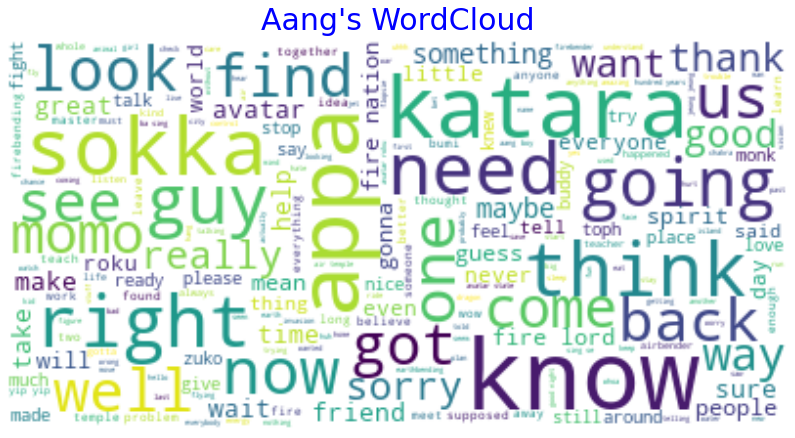

In [157]:
wordcl = WordCloud(stopwords = stopwords, background_color='white', max_font_size = 50, max_words = 2000).generate(Aang_text)
plt.figure(figsize=(14, 12))
plt.imshow(wordcl, interpolation='bilinear')
plt.title("Aang's WordCloud",
              pad=10.0,
              color='Blue',
              fontdict={
                  'fontsize':30
              })
plt.axis('off')
plt.show()

Check out Katara, Sokka and Appa out there...

Again, let's put this process into a function to select a given character.

In [158]:
def character_wordcloud(char, max_w=2000):
    '''
    Plot a character's (char) wordcloud with a max of 2000 words by default.
    '''
    text = " ".join(line for line in df_lines[df_lines['Character']==char].script.str.lower())
    
    wordcl = WordCloud(stopwords = stopwords, background_color='white', max_font_size = 50, max_words = max_w).generate(text)
    plt.figure(figsize=(14, 12))
    plt.imshow(wordcl, interpolation='bilinear')
    plt.title(char+"'s WordCloud",
              pad=10.0,
              color='Blue',
              fontdict={
                  'fontsize':30
              })
    plt.axis('off')
    plt.show()

In [233]:
def character_wordcloud_obj(char, max_w=2000):
    '''
    Return a figure of a character's (char) wordcloud with a max of 2000 words by default.
    '''
    text = " ".join(line for line in df_lines[df_lines['Character']==char].script.str.lower())
    
    wordcl = WordCloud(stopwords = stopwords, background_color='white', max_font_size = 50, max_words = max_w).generate(text)
    fig, ax = plt.subplots()
    
#     plt.figure(figsize=(14, 12))
    ax.imshow(wordcl, interpolation='bilinear')
    
    ax.axis('off')
    plt.title(char+"'s WordCloud",
              pad=10.0,
              color='Black',
              fontdict={
                  'fontsize':30
              })
    
    fig.savefig('./wordclouds/'+char+'.png')
    
    return fig

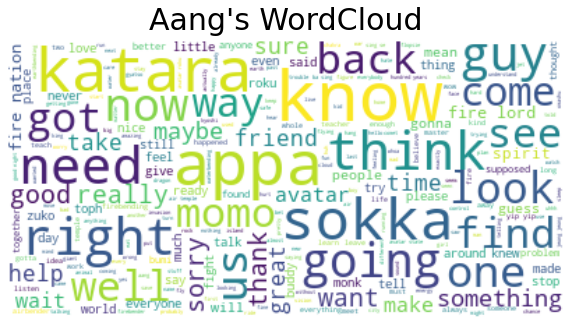

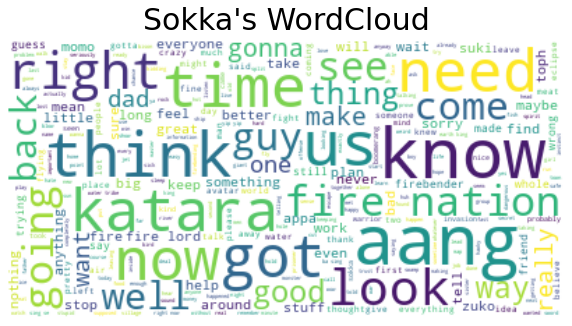

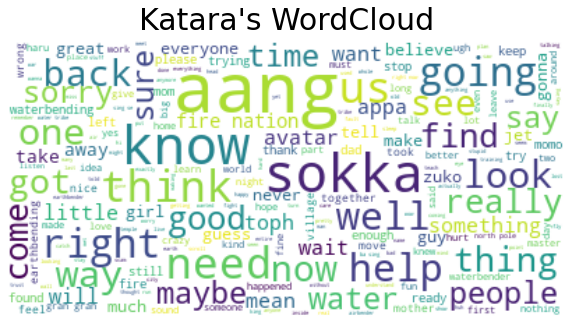

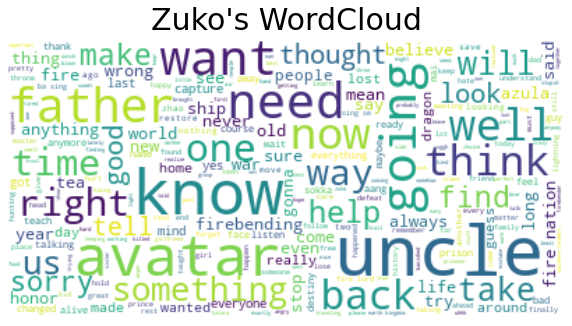

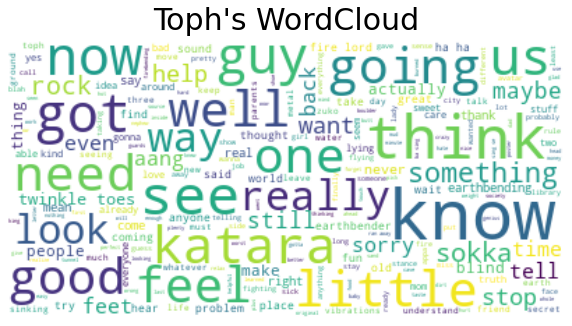

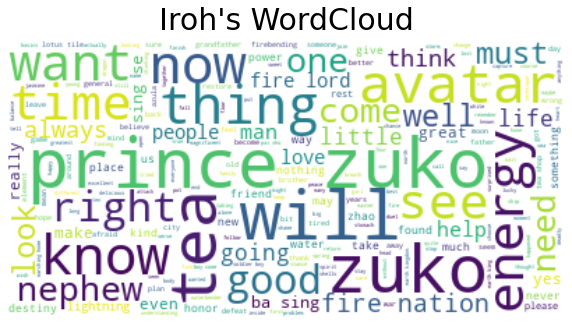

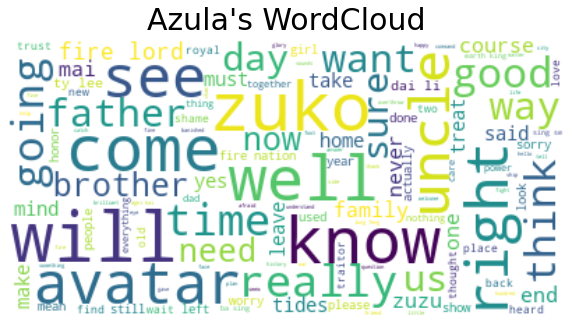

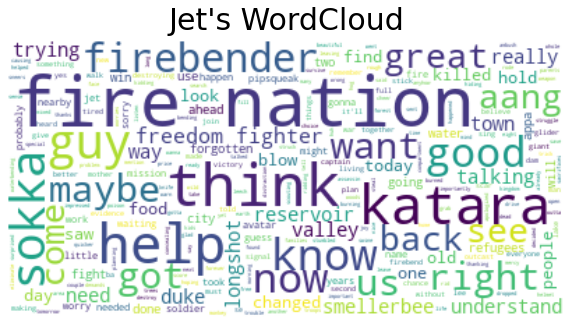

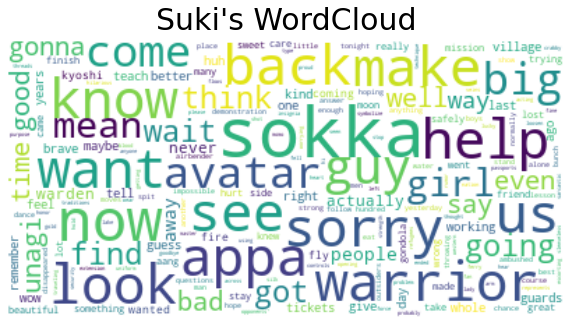

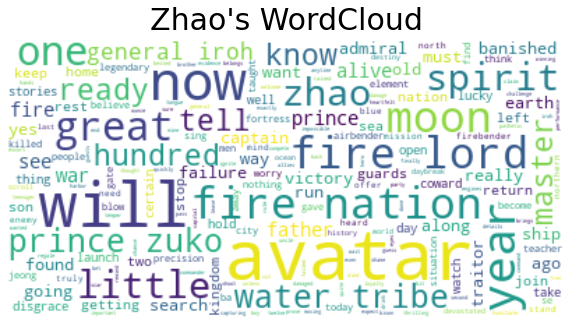

In [234]:
for char in top_10_characters.index:
    character_wordcloud_obj(char)

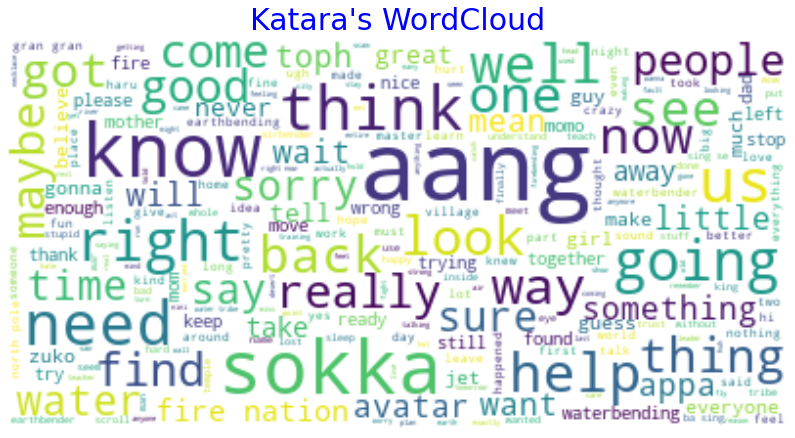

In [159]:
character_wordcloud('Katara')

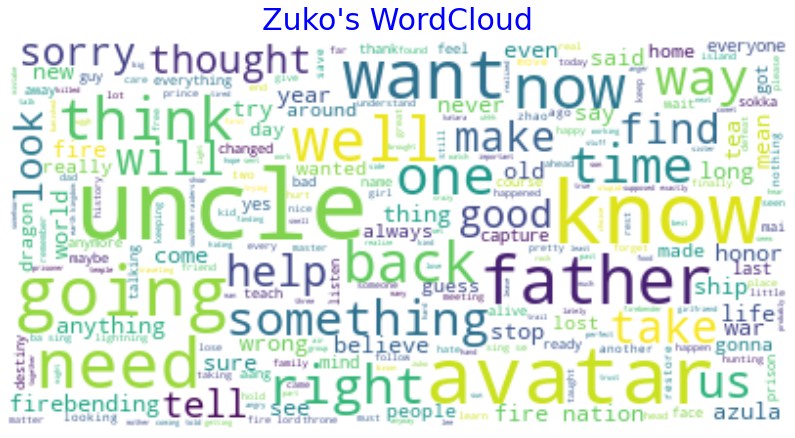

In [160]:
character_wordcloud('Zuko')

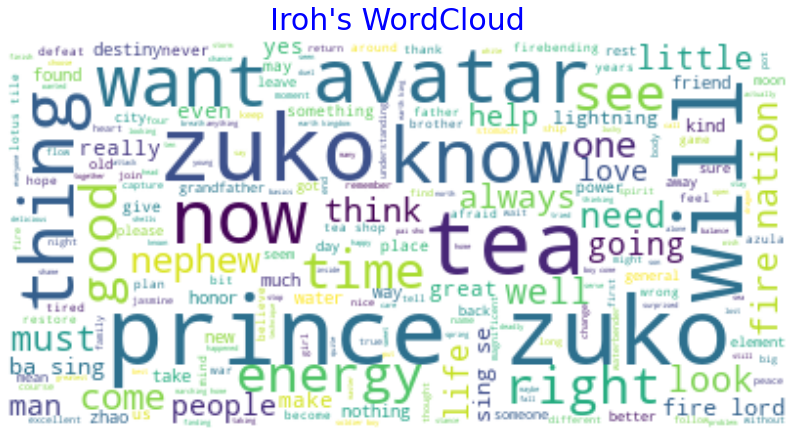

In [161]:
character_wordcloud('Iroh')

# Frequency distributions

Let's revisit the frequency distributions using `nltk`. The goal here is to inspect these distributions per character.

In [162]:
from nltk import FreqDist

In [163]:
freq = FreqDist(sum(df_lines['script_clean'].map(word_tokenize), []))

Before turning this into a dataframe, we can inspect the distribution of these most common words:

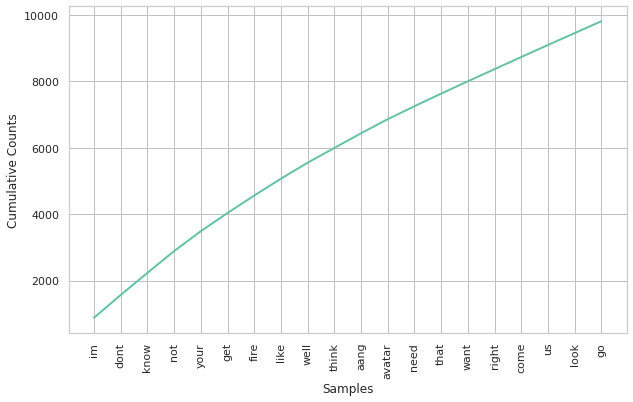

In [164]:
freq.plot(20, cumulative=True);

How many different words are there in the character lines? We'll call this *lexical diversity*.

In [165]:
print(f'Lexical diversity: len(freq)')

Lexical diversity: len(freq)


Now, to turn this into a df object and use it to get an interactive visual with plotly.

In [166]:
freq_df = pd.DataFrame(list(freq.items()), columns = ["Word","Frequency"])

In [167]:
freq_df = freq_df.sort_values(by='Frequency', ascending=False)

In [168]:
freq_df.head(20)

,Word,Frequency
32,im,881
44,dont,687
94,know,665
0,not,656
12,your,600
1,get,547
159,fire,526
45,like,508
47,well,481
182,think,445


In [169]:
len(freq_df)

4544

In [170]:
fig = px.bar(freq_df[:20], x = 'Word', y = 'Frequency',
             color=px.colors.qualitative.Light24[:20])
fig.update_layout(
    showlegend=False,
    title="Top 20 more frequent words in character lines",
    xaxis_title="Word",
    yaxis_title="Frequency"
)
fig.show()

We can build a function to get top more frequent words by character:

In [171]:
def character_word_freq_plot(char, top=20):
    '''
    Plot top 'top' more frequent words for character 'char'
    '''
    freq = FreqDist(sum(df_lines[df_lines['Character']==char]['script_clean'].map(word_tokenize), []))
    freq_df = pd.DataFrame(list(freq.items()), columns = ["Word","Frequency"])
    freq_df = freq_df.sort_values(by='Frequency', ascending=False)
    fig = px.bar(freq_df[:top], x = 'Word', y = 'Frequency',
             color=px.colors.qualitative.Light24[:top])
    fig.update_layout(
        showlegend=False,
        title=f"Top {top} more frequent words for {char}",
        xaxis_title="Word",
        yaxis_title="Frequency"
    )
    fig.show()

In [172]:
character_word_freq_plot('Aang')

In [173]:
character_word_freq_plot('Zuko')

In [174]:
character_word_freq_plot('Azula')

# Bigram Distribution

In [175]:
def character_bigram_plot(char, top=20):
    '''
    Plot top 'top' more frequent bigrams for character 'char'
    '''
    finder = nltk.collocations.BigramCollocationFinder.from_words(sum(df_lines[df_lines['Character']==char]['script_clean'].map(word_tokenize), []))
    common = finder.ngram_fd.most_common(top)
    
    bigram_list = [(' '.join(el[0]), el[1]) for el in common]
    
    freq_df = pd.DataFrame(bigram_list, columns = ["Bigram","Frequency"])
    freq_df = freq_df.sort_values(by='Frequency', ascending=False)
    fig = px.bar(freq_df[:20], x = 'Bigram', y = 'Frequency',
             color=px.colors.qualitative.Light24[:20])
    fig.update_layout(
        showlegend=False,
        title=f"Top {top} more frequent bigrams for {char}",
        xaxis_title="Bigram",
        yaxis_title="Frequency"
    )
    fig.show()

In [176]:
character_bigram_plot('Aang')

In [177]:
character_bigram_plot('Katara')

In [178]:
character_bigram_plot('Zuko')

In [179]:
character_bigram_plot('Toph')

# Word and Lexical diversity of characters

In [180]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
1,Sokka,It's not getting away from me this time. Watc...,1,1,1,not get away time watch learn katara catch fish,0.0,0.0,24
3,Katara,"Sokka, look!",1,1,1,sokka look,0.0,0.0,4
4,Sokka,"Sshh! Katara, you're going to scare it away. ...",1,1,1,sshh katara your go scare away mmmm alreadi sm...,0.0,0.0,22
6,Katara,"But, Sokka! I caught one!",1,1,1,sokka caught one,0.0,0.0,8
8,Katara,Hey!,1,1,1,,0.0,0.0,2


## Word diversity

Let's define a function to count the word diversity of a given character.

In [181]:
def word_diversity(char):
    '''
    Return the lexical diversity (an integer number) of a given character (char)
    '''
    text = sum(df_lines[df_lines['Character']==char]['script_clean'].map(word_tokenize), [])
    return len(set(text))

In [182]:
word_diversity('Aang')

1612

Now, we can create a list of tuples to store these values for each of our top 10 characters:

In [183]:
word_div_by_char = []

for char in top_10_characters.index:
    word_div_by_char.append( (char , word_diversity(char)) )

In [184]:
word_div_by_char

[('Aang', 1612),
 ('Sokka', 1918),
 ('Katara', 1488),
 ('Zuko', 1062),
 ('Toph', 893),
 ('Iroh', 975),
 ('Azula', 690),
 ('Jet', 378),
 ('Suki', 337),
 ('Zhao', 454)]

In [185]:
word_df = pd.DataFrame(word_div_by_char, columns=['Character', 'word_diversity'])
word_df

,Character,word_diversity
0,Aang,1612
1,Sokka,1918
2,Katara,1488
3,Zuko,1062
4,Toph,893
5,Iroh,975
6,Azula,690
7,Jet,378
8,Suki,337
9,Zhao,454


In [186]:
with open('./data/word_df.data', 'wb') as filehandle:
    # store the data as binary data stream
    pickle.dump(word_df, filehandle)

In [214]:
word_df[word_df.Character == 'Sokka']['word_diversity'].iloc[0]

1918

In [187]:
fig = px.bar(word_df.sort_values(by='word_diversity', ascending=False),
             x = 'Character', y = 'word_diversity',
             color=px.colors.qualitative.Light24[:10])
fig.update_layout(
    showlegend=False,
    title="Word diversity for top 10 characters",
    xaxis_title="Character",
    yaxis_title="Word Diversity"
)
fig.show()

## Lexical diversity

Similarly, we can create a function and a visual for the lexical diversity (fraction of different words by the total number of words) for each character.

In [188]:
def lexical_diversity(char):
    '''
    Return the lexical diversity (netween 0 and 1) of a given character (char)
    '''
    text = sum(df_lines[df_lines['Character']==char]['script_clean'].map(word_tokenize), [])
    return len(set(text))/len(text)

In [189]:
lexical_diversity('Aang')

0.17768959435626103

In [190]:
lexical_div_by_char = []

for char in top_10_characters.index:
    lexical_div_by_char.append( (char , lexical_diversity(char)) )
    
lexical_df = pd.DataFrame(lexical_div_by_char, columns=['Character', 'lexical_diversity'])
lexical_df

,Character,lexical_diversity
0,Aang,0.177690
1,Sokka,0.202813
2,Katara,0.200647
3,Zuko,0.241583
4,Toph,0.326508
5,Iroh,0.375433
6,Azula,0.420475
7,Jet,0.458738
8,Suki,0.562604
9,Zhao,0.563275


In [191]:
fig = px.bar(lexical_df.sort_values(by='lexical_diversity', ascending=False),
             x = 'Character', y = 'lexical_diversity',
             color=px.colors.qualitative.Light24[:10])
fig.update_layout(
    showlegend=False,
    title="Lexical diversity for top 10 characters",
    xaxis_title="Character",
    yaxis_title="Lexical Diversity"
)
fig.show()

## Word diversity per Book

We can check the evolution of word diversity in each book.

In [192]:
def word_diversity_book(book):
    '''
    Return the word diversity (an integer number) of a given book (char)
    '''
    text = sum(df_lines[df_lines['Book']==book]['script_clean'].map(word_tokenize), [])
    return len(set(text))

In [193]:
word_div_by_book = []

for i in [1,2,3]:
    word_div_by_book.append( (i , word_diversity_book(i)) )
    
word_df_book = pd.DataFrame(word_div_by_book , columns=['Book', 'word_diversity'])
word_df_book

,Book,word_diversity
0,1,2602
1,2,2755
2,3,2678


In [194]:
fig = px.bar(word_df_book.sort_values(by='word_diversity', ascending=False),
             x = 'Book', y = 'word_diversity',
             color=px.colors.qualitative.Light24[:3])
fig.update_layout(
    showlegend=False,
    title="Word diversity for all Books",
    xaxis_title="Book",
    yaxis_title="Word Diversity"
)
fig.show()

## Word diversity per episode

Let's build a graph for the evolution of word diversity of each of the top 10 characters with more lines per episode. The idea here will be very similar to what we've done with the evolution of polarity, subjectivity and word count.

In [195]:
df_lines.head()

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
1,Sokka,It's not getting away from me this time. Watc...,1,1,1,not get away time watch learn katara catch fish,0.0,0.0,24
3,Katara,"Sokka, look!",1,1,1,sokka look,0.0,0.0,4
4,Sokka,"Sshh! Katara, you're going to scare it away. ...",1,1,1,sshh katara your go scare away mmmm alreadi sm...,0.0,0.0,22
6,Katara,"But, Sokka! I caught one!",1,1,1,sokka caught one,0.0,0.0,8
8,Katara,Hey!,1,1,1,,0.0,0.0,2


In [196]:
def get_word_div_per_episode(char):
    '''
    Returns the evolution of word diversity by episode for a given character
    '''
    
    word_div_episode = []
    for i in df_lines['total_number'].unique():
        text = sum(df_lines[(df_lines['Character']==char) & (df_lines['total_number']==i)]['script_clean'].map(word_tokenize), [])
        word_div_episode.append((i, len(set(text))))
        
    df = pd.DataFrame(word_div_episode, columns=['episode', 'word_diversity'])        

    return df

In [197]:
aangs_word_div = get_word_div_per_episode('Aang')

In [198]:
aangs_word_div

,episode,word_diversity
0,1,141
1,2,93
2,3,143
3,4,143
4,5,191
...,...,...
56,57,51
57,58,133
58,59,122
59,60,10


In [199]:
fig = go.Figure()

for char in top_10_characters.index:

    fig.add_scatter(x = get_word_div_per_episode(char)['episode'],
                    y = get_word_div_per_episode(char)['word_diversity'],
                    hovertext=list(zip(get_word_div_per_episode(char)['episode'],
                                  get_word_div_per_episode(char)['word_diversity'])),
                    name = char)
fig.update_layout(
    title="Evolution of word diversity - Top 10 Characters with more lines",
    xaxis_title="Episode number (in entire series)",
    yaxis_title="Word diversity of lines",
    hovermode="x unified"
    )

fig.add_vrect(
    # Add background color for Book 1
    x0=1, x1=20,
    fillcolor="LightBlue", opacity=0.5,
    layer="below", line_width=0,
)

fig.add_vrect(
    # Add background color for Book 2
    x0=20, x1=40,
    fillcolor="LightGreen", opacity=0.5,
    layer="below", line_width=0,
)

fig.add_vrect(
    # Add background color for Book 3
    x0=40, x1=64,
    fillcolor="Red", opacity=0.2,
    layer="below", line_width=0,
)

fig.add_annotation(x=4, y=300,
            text="Book 1",
            showarrow=False,
            yshift=10,
            font=dict(
                family="Courier New, monospace",
                size=16,
                color="Blue"
            )
                  )
fig.add_annotation(x=30, y=300,
            text="Book 2",
            showarrow=False,
            yshift=10,
            font=dict(
                family="Courier New, monospace",
                size=16,
                color="DarkGreen"
            )
                  )
fig.add_annotation(x=50, y=300,
            text="Book 3",
            showarrow=False,
            yshift=10,
            font=dict(
                family="Courier New, monospace",
                size=16,
                color="crimson"
            )
                  )


fig.show()

There is a huge peak for Zuko with 280 different words in a single episode! Let's find out which one.

Using the hover information, we see it is episode 53:

In [200]:
get_character_lines_episode(['Zuko'], 53)

,Character,script,ep_number,Book,total_number,script_clean,polarity,subjectivity,word_count
11496,Zuko,"I know you're nervous, but remember, firebendi...",13,3,53,know your nervou rememb firebend not someth fear,0.000000,0.000000,20
11498,Zuko,"But if you don't respect it, it'll chew you ...",13,3,53,dont respect itll chew spit like angri komodo ...,-0.625000,1.000000,23
11500,Zuko,Now show me what you've got. Any amount of fir...,13,3,53,show youv got amount fire make,0.000000,0.000000,16
11503,Zuko,Good idea. You might wanna take a couple step...,13,3,53,good idea might wan na take coupl step back,0.350000,0.300000,13
11505,Zuko,What was that? That was the worst firebending...,13,3,53,worst firebend ive ever seen,-1.000000,1.000000,14
...,...,...,...,...,...,...,...,...,...
11719,Zuko,"Yeah. It's like the Sun, but inside of you. D...",13,3,53,like sun insid guy realiz,0.000000,0.000000,19
11721,Zuko,That's why my firebending was so weak before. ...,13,3,53,that firebend weak mani year hunt drive purpos...,0.065341,0.436553,65
11728,Zuko,It's not a dance. It's a firebending form.,13,3,53,not danc firebend form,0.000000,0.000000,12
11730,Zuko,It's a sacred form that happens to be thousan...,13,3,53,sacr form happen thousand year old,0.125000,0.200000,14


Zuko has 71 lines in this episode. The episode name can be checked with our helper function:

In [201]:
check_episode(13,3)

'The Firebending Masters'

This is a great episode. Zuko tells Aang about an ancient firebending tribe and the story of his ancestors hunting down dragons. They proceed to find out the tribe is still living and discover the true origin of firebending.

---

## Lexical diversity per episode

We can do the same process to get the lexical diversity per episode:

In [202]:
def get_lex_div_per_episode(char):
    '''
    Returns the evolution of lexical diversity by episode for a given character
    '''
    
    lex_div_episode = []
    for i in df_lines['total_number'].unique():
        text = sum(df_lines[(df_lines['Character']==char) & (df_lines['total_number']==i)]['script_clean'].map(word_tokenize), [])
        try:
            lex_div_episode.append( (i, len(set(text))/len(text)) )
        except:
            lex_div_episode.append( (i, 0) )
        
    df = pd.DataFrame(lex_div_episode, columns=['episode', 'lexical_diversity'])        

    return df

In [203]:
fig = go.Figure()

for char in top_10_characters.index:

    fig.add_scatter(x = get_lex_div_per_episode(char)['episode'],
                    y = get_lex_div_per_episode(char)['lexical_diversity'],
                    hovertext=list(zip(get_lex_div_per_episode(char)['episode'],
                                  get_lex_div_per_episode(char)['lexical_diversity'])),
                    name = char)
fig.update_layout(
    title="Evolution of lexical diversity - Top 10 Characters with more lines",
    xaxis_title="Episode number (in entire series)",
    yaxis_title="Lexical diversity of lines",
    hovermode="x unified"
    )

fig.add_vrect(
    # Add background color for Book 1
    x0=1, x1=20,
    fillcolor="LightBlue", opacity=0.5,
    layer="below", line_width=0,
)

fig.add_vrect(
    # Add background color for Book 2
    x0=20, x1=40,
    fillcolor="LightGreen", opacity=0.5,
    layer="below", line_width=0,
)

fig.add_vrect(
    # Add background color for Book 3
    x0=40, x1=64,
    fillcolor="Red", opacity=0.2,
    layer="below", line_width=0,
)

fig.add_annotation(x=4, y=1,
            text="Book 1",
            showarrow=False,
            yshift=10,
            font=dict(
                family="Courier New, monospace",
                size=16,
                color="Blue"
            )
                  )
fig.add_annotation(x=30, y=1,
            text="Book 2",
            showarrow=False,
            yshift=10,
            font=dict(
                family="Courier New, monospace",
                size=16,
                color="DarkGreen"
            )
                  )
fig.add_annotation(x=50, y=1,
            text="Book 3",
            showarrow=False,
            yshift=10,
            font=dict(
                family="Courier New, monospace",
                size=16,
                color="crimson"
            )
                  )


fig.show()

# Saving our dataframe

To reuse our dataframe with all our preprocessing, we'll dump `df_lines` into a pickled object.

In [204]:
with open('./data/df_lines.data', 'wb') as filehandle:
    # store the data as binary data stream
    pickle.dump(df_lines, filehandle)

# Ending the EDA (for now?)

There are many great things about this show. Its characters, its animation, its story and is evolution. Personally, this is one of my favorite shows ever! This data exploration has help me dig deep into an old passion. Hopefully, it will help someone else (re)discover the show and dig deep into the characters that make for such an interesting story!

Beyond this, it was great fun to explore NLP tools and general analysis. Interactive plots with plotly are always a fun and interesting task and using nltk (and textblob) is easy and intuitve! The next step will be to create a model from this cleaned dataset and see if we can classify text as belonging to some of the main characters.

# Try to classify text

Can we build a model to classify if text belongs to one of the main characetrs?
Basic idea [here](https://realpython.com/python-keras-text-classification/).

In [208]:
for char in top_10_characters.index:
    print(char)

Aang
Sokka
Katara
Zuko
Toph
Iroh
Azula
Jet
Suki
Zhao


pandas.core.series.Series